## 1. Importación de Librerías

In [ ]:
#Procedemos a instalar catboost
!pip install catboost

In [ ]:
#Importamos las librerias
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import plotly.graph_objs as go
import seaborn as sns
from collections import Counter
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import r2_score, accuracy_score
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
import joblib


import warnings
warnings.filterwarnings("ignore")

In [ ]:
#Creamos un dataframe para poder visualizar
df = pd.read_csv('/content/drive/MyDrive/Airbnb_Data.csv')

## 2. Descripcion del Dataset

In [ ]:
#Creamos funciones que nos ayudaran a visualizar toda la data
def caracteristicas_df(df):
    """
    Describe de forma general la base de datos.

    Esta función simplemente muestra el tamaño, información general y
    la cantidad de datos nulos.

    Parametros
    ----------
    df (pandas.DataFrame): El DataFrame que se va a analizar.

    Returns:
    ----------
        - 'df.shape': Numero de filas y columnas
        - 'df.info': Muestra información general del DataFrame

    """
    print('*'*10 + '|'*10 + 'FORMA DE BASE DE DATOS' + '|'*10 + '*'*10, end = '\n'*2)
    print(f'Tiene {df.shape[0]} filas y {df.shape[1]} columnas o variables')
    print(end = '\n'*2)

    print('*'*10 + '|'*10 + 'INFORMACION GENERAL DE LA BASE DE DATOS' + '|'*10 + '*'*10, end = '\n'*2)
    print(df.info(), end = '\n'*2)

def valores_nulos_df(df):
    """
    Revisa presencia de valores nulos en un DataFrame.
    Esta función toma un DataFrame como entrada y devuelve un resumen que incluye información sobre
    el porcentaje de valores no nulos y nulos, así como la ncantidad de valores nulos por columna.

    Parametros:
    ----------
    df (pandas.DataFrame): El DataFrame que se va a analizar.

    Returns:
    ----------
        pandas.DataFrame: Un DataFrame que contiene el resumen de cada columna, incluyendo:
        - 'nombre': Nombre de cada columna.
        - 'no_nulos_%': Porcentaje de valores no nulos en cada columna.
        - 'nulos_%': Porcentaje de valores nulos en cada columna.
        - 'nulos': Cantidad de valores nulos en cada columna.

    """
    mi_df = {"nombre": [], "tipo_datos": [], "nulos_%": [], "nulos": []}

    for columna in df.columns:
        porcentaje_no_nulos = (df[columna].count() / len(df)) * 100
        mi_df["nombre"].append(columna)
        mi_df["tipo_datos"].append(df[columna].apply(type).unique())
        mi_df["nulos_%"].append(round(100-porcentaje_no_nulos, 2))
        mi_df["nulos"].append(df[columna].isnull().sum())

    df_nulos = pd.DataFrame(mi_df)

    return df_nulos

In [ ]:
#Visualizamos toda la data
caracteristicas_df(df)

**********||||||||||FORMA DE BASE DE DATOS||||||||||**********

Tiene 74111 filas y 29 columnas o variables


**********||||||||||INFORMACION GENERAL DE LA BASE DE DATOS||||||||||**********

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74111 entries, 0 to 74110
Data columns (total 29 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      74111 non-null  int64  
 1   log_price               74111 non-null  float64
 2   property_type           74111 non-null  object 
 3   room_type               74111 non-null  object 
 4   amenities               74111 non-null  object 
 5   accommodates            74111 non-null  int64  
 6   bathrooms               73911 non-null  float64
 7   bed_type                74111 non-null  object 
 8   cancellation_policy     74111 non-null  object 
 9   cleaning_fee            74111 non-null  bool   
 10  city                    74111 non-null  object 
 11  descri

In [ ]:
#Visualizamos los valores nulos de la data
valores_nulos_df(df)

,nombre,tipo_datos,nulos_%,nulos
0,id,[<class 'int'>],0.00,0
1,log_price,[<class 'float'>],0.00,0
2,property_type,[<class 'str'>],0.00,0
3,room_type,[<class 'str'>],0.00,0
4,amenities,[<class 'str'>],0.00,0
5,accommodates,[<class 'int'>],0.00,0
6,bathrooms,[<class 'float'>],0.27,200
7,bed_type,[<class 'str'>],0.00,0
8,cancellation_policy,[<class 'str'>],0.00,0
9,cleaning_fee,[<class 'bool'>],0.00,0


In [ ]:
#Hacemos una lista de las columnas que nos parecen prioritarias
columnas_prioritarias = [
    "log_price",
    "property_type",
    "room_type",
    "accommodates",
    "amenities",
    "bathrooms",
    "bed_type",
    "cancellation_policy",
    "cleaning_fee",
    "city",
    "instant_bookable",
    "host_has_profile_pic",
    "host_identity_verified",
    "latitude",
    "longitude",
    "name",
    "neighbourhood",
    "number_of_reviews",
    "bedrooms",
    "beds",
]

In [ ]:
#Realizamos una mascara para elegir solo las columnas que necesitamos
air_bnb = df[columnas_prioritarias]
air_bnb.head()

,log_price,property_type,room_type,accommodates,amenities,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,instant_bookable,host_has_profile_pic,host_identity_verified,latitude,longitude,name,neighbourhood,number_of_reviews,bedrooms,beds
0,5.010635,Apartment,Entire home/apt,3,"{""Wireless Internet"",""Air conditioning"",Kitche...",1.0,Real Bed,strict,True,NYC,f,t,t,40.696524,-73.991617,Beautiful brownstone 1-bedroom,Brooklyn Heights,2,1.0,1.0
1,5.129899,Apartment,Entire home/apt,7,"{""Wireless Internet"",""Air conditioning"",Kitche...",1.0,Real Bed,strict,True,NYC,t,t,f,40.766115,-73.989040,Superb 3BR Apt Located Near Times Square,Hell's Kitchen,6,3.0,3.0
2,4.976734,Apartment,Entire home/apt,5,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",1.0,Real Bed,moderate,True,NYC,t,t,t,40.808110,-73.943756,The Garden Oasis,Harlem,10,1.0,3.0
3,6.620073,House,Entire home/apt,4,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",1.0,Real Bed,flexible,True,SF,f,t,t,37.772004,-122.431619,Beautiful Flat in the Heart of SF!,Lower Haight,0,2.0,2.0
4,4.744932,Apartment,Entire home/apt,2,"{TV,Internet,""Wireless Internet"",""Air conditio...",1.0,Real Bed,moderate,True,DC,t,t,t,38.925627,-77.034596,Great studio in midtown DC,Columbia Heights,4,0.0,1.0


In [ ]:
#Visualizamos las caracteristicas de la data
caracteristicas_df(air_bnb)

**********||||||||||FORMA DE BASE DE DATOS||||||||||**********

Tiene 74111 filas y 20 columnas o variables


**********||||||||||INFORMACION GENERAL DE LA BASE DE DATOS||||||||||**********

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74111 entries, 0 to 74110
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   log_price               74111 non-null  float64
 1   property_type           74111 non-null  object 
 2   room_type               74111 non-null  object 
 3   accommodates            74111 non-null  int64  
 4   amenities               74111 non-null  object 
 5   bathrooms               73911 non-null  float64
 6   bed_type                74111 non-null  object 
 7   cancellation_policy     74111 non-null  object 
 8   cleaning_fee            74111 non-null  bool   
 9   city                    74111 non-null  object 
 10  instant_bookable        74111 non-null  object 
 11  host_h

In [ ]:
#Visualizamos los valores nulos de la data
valores_nulos_df(air_bnb)

,nombre,tipo_datos,nulos_%,nulos
0,log_price,[<class 'float'>],0.00,0
1,property_type,[<class 'str'>],0.00,0
2,room_type,[<class 'str'>],0.00,0
3,accommodates,[<class 'int'>],0.00,0
4,amenities,[<class 'str'>],0.00,0
5,bathrooms,[<class 'float'>],0.27,200
6,bed_type,[<class 'str'>],0.00,0
7,cancellation_policy,[<class 'str'>],0.00,0
8,cleaning_fee,[<class 'bool'>],0.00,0
9,city,[<class 'str'>],0.00,0


## 3. Transformaciones al Dataset

In [ ]:
air_bnb["instant_bookable"] = air_bnb["instant_bookable"].map({"t": True, "f": False})

In [ ]:
air_bnb.duplicated().sum()

0

Procederemos a imputar los valores nulos que existen en la columna "neighbourhood" mediante KNN

In [ ]:
air_bnb_neigh = df[['latitude','longitude','neighbourhood']]

In [ ]:
#Seleccionamos las filas donde la columna "neighbourhood" es NaN y elimina la columna "neighbourhood" de esas filas.
X_test_nbrs = air_bnb_neigh.loc[air_bnb_neigh["neighbourhood"].isna()].drop(
    "neighbourhood", axis=1
)

#Seleccionamos las filas donde la columna "neighbourhood" no es NaN.
df_neighbourhood_not_na = air_bnb_neigh.loc[
    ~air_bnb_neigh["neighbourhood"].isna()
]

#Dividimos el conjunto de datos donde "neighbourhood" no es NaN en características (X) y la variable objetivo (y).
X_train_nbrs, y_train_nbrs = (
    df_neighbourhood_not_na.drop(["neighbourhood"], axis=1),  # Características (X)
    df_neighbourhood_not_na["neighbourhood"],  # Variable objetivo (y)
)

#Creamos una instancia del clasificador K-Nearest Neighbors con 2 vecinos.
nbrs = KNeighborsClassifier(n_neighbors=2)

#Ajustamos el modelo a los datos de entrenamiento.
nbrs.fit(X_train_nbrs, y_train_nbrs)

#Predecimos los valores de "neighbourhood" para los datos de prueba.
nbrs_pred = nbrs.predict(X_test_nbrs)

#Convertimos las predicciones a una Serie de pandas con los mismos índices que los datos de prueba.
nbrs_pred = pd.Series(nbrs_pred, index=X_test_nbrs.index)

#Muestramos las predicciones.
nbrs_pred

6        Marina Del Rey
9           West Covina
14           Long Beach
26            Hollywood
28             Downtown
              ...      
74098         Hollywood
74099         Hollywood
74101      Santa Monica
74104        Gold Coast
74105    West Hollywood
Length: 6872, dtype: object

In [ ]:
#Procedemos a imputar los valores nulos de la columna "neighbourhood" con nuestra predicciones
air_bnb['neighbourhood'] = air_bnb['neighbourhood'].fillna(value=nbrs_pred)

Procedemos a transformar la columna de "amenities" ya que es un diccionario anidado

In [ ]:
#Definir una pequeña función para limpiar la lista de amenities
def clean_amenities(amenities):
    try:
        #Removemos las llaves y dividir la cadena en elementos separados por comas
        items = amenities.strip("{}").split(",")
        #Removemos las comillas dobles de cada elemento
        cleaned_items = [item.strip('"') for item in items]
        return cleaned_items
    except AttributeError:
        #En caso de que amenities no sea una cadena, retornar el valor original
        return amenities

#Aplicamos la función a la columna "amenities" del DataFrame
df["amenities"] = df["amenities"].apply(clean_amenities)

In [ ]:
#Procedemos a eliminar los demas valores nulos ya que son en menor cantidad
air_bnb.dropna(inplace=True)

In [ ]:
#Procedemos visualizar las caracteristicas de nuestra data
caracteristicas_df(air_bnb)

**********||||||||||FORMA DE BASE DE DATOS||||||||||**********

Tiene 73579 filas y 20 columnas o variables


**********||||||||||INFORMACION GENERAL DE LA BASE DE DATOS||||||||||**********

<class 'pandas.core.frame.DataFrame'>
Index: 73579 entries, 0 to 74110
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   log_price               73579 non-null  float64
 1   property_type           73579 non-null  object 
 2   room_type               73579 non-null  object 
 3   accommodates            73579 non-null  int64  
 4   amenities               73579 non-null  object 
 5   bathrooms               73579 non-null  float64
 6   bed_type                73579 non-null  object 
 7   cancellation_policy     73579 non-null  object 
 8   cleaning_fee            73579 non-null  bool   
 9   city                    73579 non-null  object 
 10  instant_bookable        73579 non-null  bool   
 11  host_has_pr

Si el recuento de valor de un determinado tipo de propiedad está por debajo de cierto umbral, se le cambiará el nombre a "Otro", ya que hay demasiados tipos de propiedad y también hay demasiados con recuentos de valor extremadamente bajos. Así podemos reducir caracteristicas innecesarias

In [ ]:
#Verificamos la cantidad de tipos
len(air_bnb["property_type"].value_counts())

34

In [ ]:
#Visualizamos la cantidad de los diferentes tipos
air_bnb['property_type'].value_counts()

property_type
Apartment             48610
House                 16424
Condominium            2650
Townhouse              1683
Loft                   1236
Other                   600
Guesthouse              497
Bed & Breakfast         457
Bungalow                365
Villa                   178
Dorm                    134
Guest suite             123
Camper/RV                93
Timeshare                76
Cabin                    71
In-law                   71
Hostel                   70
Boutique hotel           69
Boat                     65
Serviced apartment       21
Tent                     18
Castle                   13
Vacation home            11
Yurt                      9
Hut                       8
Treehouse                 7
Chalet                    6
Earth House               4
Tipi                      3
Train                     2
Cave                      2
Casa particular           1
Lighthouse                1
Island                    1
Name: count, dtype: int64

In [ ]:
#Obtenemos el conteo de cada tipo de propiedad
property_counts = air_bnb["property_type"].value_counts()

#Obtenemos el conteo de "Villa"
villa_count = property_counts.get("Villa", 0)

#Función para reemplazar tipos de propiedad según el criterio especificado
def categorize_property(property_type):
    if property_counts[property_type] < villa_count:
        return "Other"
    return property_type

#Aplicamos la función a la columna "property_type"
air_bnb["property_type"] = air_bnb["property_type"].apply(categorize_property)

#Mostramos el conteo de cada tipo de propiedad
print(air_bnb["property_type"].value_counts())

property_type
Apartment          48610
House              16424
Condominium         2650
Townhouse           1683
Other               1479
Loft                1236
Guesthouse           497
Bed & Breakfast      457
Bungalow             365
Villa                178
Name: count, dtype: int64


In [ ]:
#Definimos el umbral de frecuencia mínima
min_count_threshold = 5

#Obtenemos el conteo de cada vecindario
neighbourhood_counts = air_bnb["neighbourhood"].value_counts()

#Filtramos vecindarios que cumplen con el umbral de frecuencia mínima
frequent_neighbourhoods = neighbourhood_counts[neighbourhood_counts >= min_count_threshold].index

#Filtramos el DataFrame para mantener solo las entradas con vecindarios frecuentes
df_filtered = air_bnb[air_bnb["neighbourhood"].isin(frequent_neighbourhoods)].reset_index(drop=True)

# Mostramos información del DataFrame filtrado
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73349 entries, 0 to 73348
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   log_price               73349 non-null  float64
 1   property_type           73349 non-null  object 
 2   room_type               73349 non-null  object 
 3   accommodates            73349 non-null  int64  
 4   amenities               73349 non-null  object 
 5   bathrooms               73349 non-null  float64
 6   bed_type                73349 non-null  object 
 7   cancellation_policy     73349 non-null  object 
 8   cleaning_fee            73349 non-null  bool   
 9   city                    73349 non-null  object 
 10  instant_bookable        73349 non-null  bool   
 11  host_has_profile_pic    73349 non-null  object 
 12  host_identity_verified  73349 non-null  object 
 13  latitude                73349 non-null  float64
 14  longitude               73349 non-null

## 4. Ingeniería de Caracteristicas

In [ ]:
#Definimos una pequeña función para verificar la presencia de elementos en la lista de comodidades
def has_item(amenities_list, items):
    return any(item in amenities_list for item in items)

# Crear columnas booleanas para cada característica
df_filtered["has_internet"] = df_filtered["amenities"].apply(lambda amenities_list: has_item(amenities_list, ["Wireless Internet", "Internet"]))
df_filtered["has_air_conditioning"] = df_filtered["amenities"].apply(lambda amenities_list: "Air conditioning" in amenities_list)
df_filtered["has_kitchen"] = df_filtered["amenities"].apply(lambda amenities_list: "Kitchen" in amenities_list)
df_filtered["has_cable_tv"] = df_filtered["amenities"].apply(lambda amenities_list: has_item(amenities_list, ["TV", "Cable TV"]))
df_filtered["has_luxuries"] = df_filtered["amenities"].apply(lambda amenities_list: has_item(amenities_list, ["Gym", "Hot tub", "Pool"]))

# Seleccionar columnas booleanas y categóricas
df_bool = df_filtered.select_dtypes(include=np.bool_)
df_categorical = df_filtered.select_dtypes(include=object)

# Seleccionar columnas numéricas
df_numerical = df_filtered.select_dtypes(include=np.number)

# Concatenar las columnas numéricas y booleanas
df_non_categorical = pd.concat([df_numerical, df_bool], axis=1)

## 5. EDA

In [ ]:
#Creamos el gráfico de dispersión en un mapa
fig = px.scatter_mapbox(
    df_filtered,
    lat="latitude",
    lon="longitude",
    color="log_price",
    color_continuous_scale=px.colors.cyclical.Phase,
    size="number_of_reviews",
    hover_name="name",
    hover_data=["property_type", "room_type", "neighbourhood"],
)

#Configurar el estilo del mapa
fig.update_layout(
    mapbox_style="open-street-map",
    mapbox_bounds={"west": -160, "east": -50, "south": 20, "north": 90},
    height=800,
    width=1400
)

#Mostrar el gráfico
fig.show()

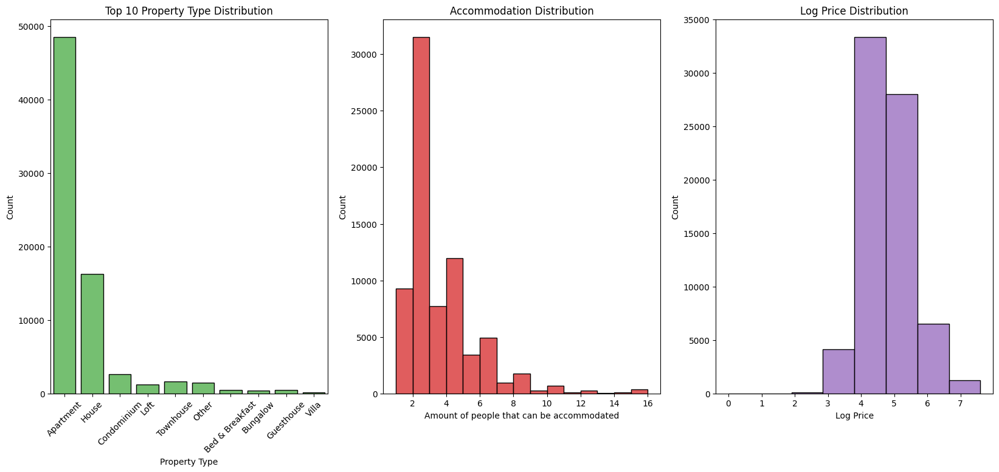

In [ ]:
#Creamos la figura y los ejes
fig, ax = plt.subplots(1, 3, figsize=(20, 8))

# Gráfico de barras para la distribución de los 10 primeros tipos de propiedad
top_property_types = df_filtered["property_type"].value_counts().head(10).index
df_top_property_types = df_filtered[df_filtered["property_type"].isin(top_property_types)]
sns.countplot(
    x="property_type",
    data=df_top_property_types,
    color=sns.color_palette("muted")[2],
    edgecolor="black",
    ax=ax[0],
)
ax[0].set_title("Top 10 Property Type Distribution")
ax[0].set_ylabel("Count")
ax[0].set_xlabel("Property Type")
ax[0].tick_params(axis='x', rotation=45)

#Histograma para la distribución de alojamiento
sns.histplot(
    x="accommodates",
    data=df_filtered,
    binwidth=1,
    color=sns.color_palette()[3],
    ax=ax[1]
)
ax[1].set_title("Accommodation Distribution")
ax[1].set_xlabel("Amount of people that can be accommodated")
ax[1].set_ylabel("Count")

#Histograma para la distribución de precios (logaritmo)
sns.histplot(
    data=df_filtered,
    x="log_price",
    edgecolor="black",
    bins=8,
    ax=ax[2],
    color=sns.color_palette()[4],
)
ax[2].set_title("Log Price Distribution")
ax[2].set_xlabel("Log Price")
ax[2].set_ylabel("Count")

#Mostramos el gráfico
plt.show()

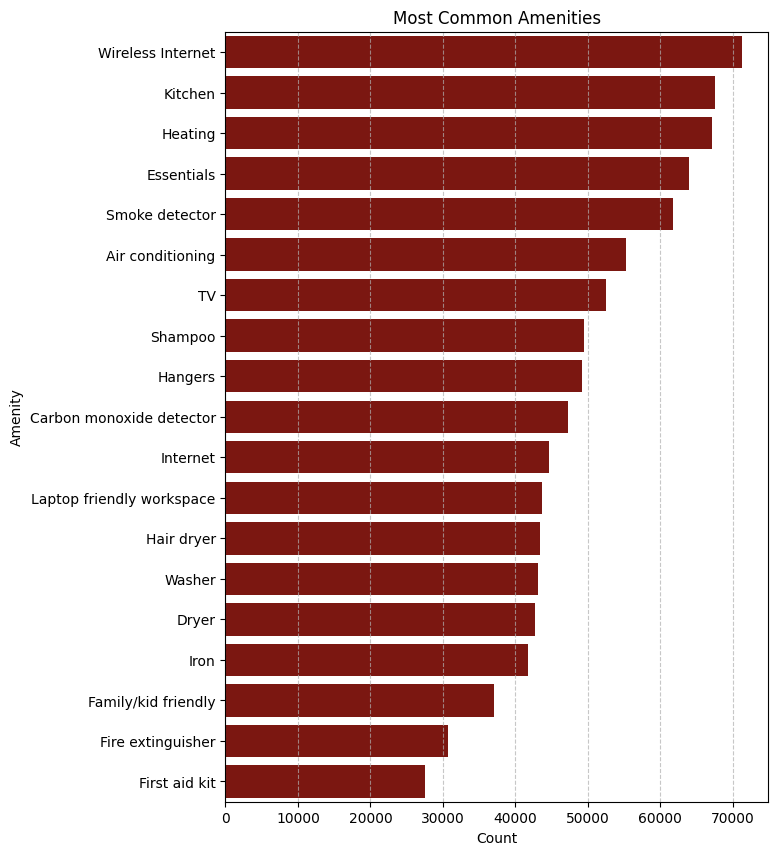

In [ ]:
#Contar las comodidades
amenities_count = [item for sublist in df["amenities"] for item in sublist]
amenities_count = Counter(amenities_count)
df_amenities = (
    pd.DataFrame.from_dict(amenities_count, orient="index", columns=["Count"])
    .reset_index()
    .rename({"index": "Amenity"}, axis=1)
    .sort_values(by="Count", ascending=False)
)

#Número de comodidades a mostrar
NUM_COL = 19
colour = sns.color_palette(palette="dark")[3]

plt.figure(figsize=(7, 10))
sns.barplot(
    y=df_amenities["Amenity"].head(NUM_COL),
    x=df_amenities["Count"].head(NUM_COL),
    color=colour,
)
plt.title("Most Common Amenities")
plt.xlabel("Count")
plt.ylabel("Amenity")
plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.show()

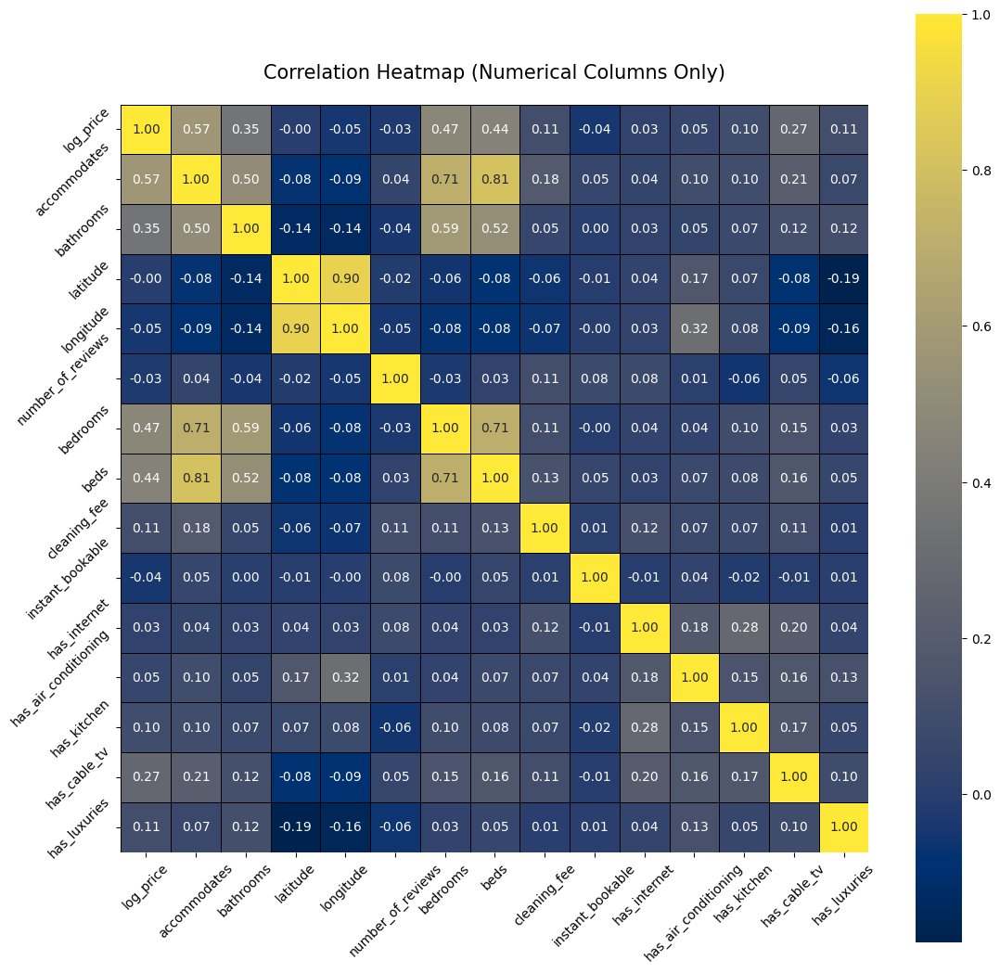

In [ ]:
#Creamos el tamaño de la figura
plt.figure(figsize=(13, 13))

#Creamos el mapa de calor de correlación
sns.heatmap(
    df_non_categorical.corr(),  # Utilizar la correlación de las columnas numéricas del DataFrame
    annot=True,                 # Mostrar los valores de correlación en las celdas
    cmap="cividis",             # Elegir un esquema de color para el mapa de calor
    fmt=".2f",                  # Formato de las anotaciones (dos decimales)
    square=True,                # Hacer que las celdas sean cuadradas
    linewidths=0.5,             # Grosor de las líneas entre las celdas
    linecolor='black',          # Color de las líneas entre las celdas
    annot_kws={"size": 10},    # Ajustar el tamaño de la fuente de las anotaciones
)

#Agregamos título al mapa de calor
plt.title("Correlation Heatmap (Numerical Columns Only)", fontsize=15, pad=20)

#Rotamos las etiquetas del eje x para una mejor visualización
plt.xticks(rotation=45)

#Rotamos las etiquetas del eje y para una mejor visualización
plt.yticks(rotation=45)

#Mostramos el mapa de calor
plt.show()

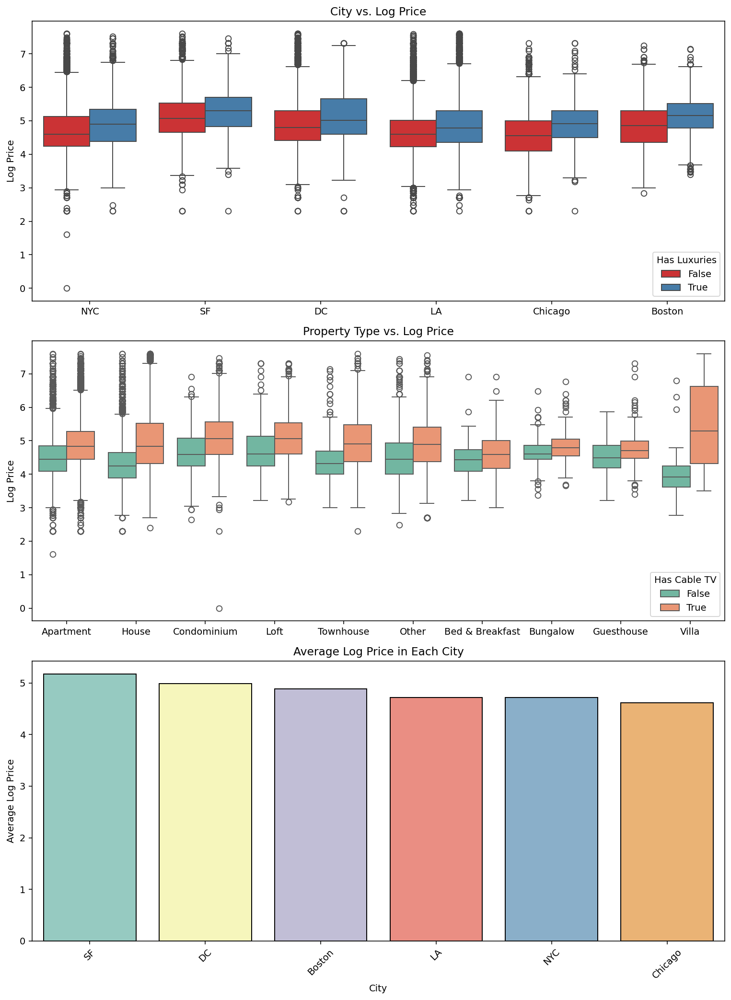

In [ ]:
#Crear la figura y los ejes
fig, ax = plt.subplots(3, 1, figsize=(11, 15), dpi=140)

#Gráfico de cajas para comparar el precio en función de la ciudad y si tiene lujos
sns.boxplot(
    x="city",
    y="log_price",
    data=df_filtered,
    hue="has_luxuries",
    ax=ax[0],
    palette="Set1",  # Usar una paleta de colores más distintiva
)
ax[0].set_title("City vs. Log Price")
ax[0].set_xlabel("")
ax[0].set_ylabel("Log Price")
ax[0].legend(title="Has Luxuries")  # Añadir título a la leyenda

#Gráfico de cajas para comparar el precio en función del tipo de propiedad y si tiene TV por cable
sns.boxplot(
    x="property_type",
    y="log_price",
    hue="has_cable_tv",
    data=df_filtered,
    ax=ax[1],
    palette="Set2",  # Usar una paleta de colores más distintiva
)
ax[1].set_title("Property Type vs. Log Price")
ax[1].set_xlabel("")
ax[1].set_ylabel("Log Price")
ax[1].legend(title="Has Cable TV")  # Añadir título a la leyenda

data_city = pd.DataFrame.from_dict(
    dict(df.groupby("city")["log_price"].mean().sort_values(ascending=False)),
    orient="index",
    columns=["log_price"],
)
#Gráfico de barras para mostrar el precio promedio en cada ciudad
sns.barplot(
    x=data_city.index,
    y="log_price",
    data=data_city,
    palette="Set3",  # Usar una paleta de colores más distintiva
    edgecolor="black",
    ax=ax[2],
)
ax[2].set_title("Average Log Price in Each City")
ax[2].set_xlabel("City")
ax[2].set_ylabel("Average Log Price")

#Rotamos las etiquetas del eje x para una mejor visualización en el último gráfico
ax[2].tick_params(axis="x", rotation=45)

#Ajustamos el espaciado entre los subplots
plt.tight_layout()

#Mostramos el gráfico
plt.show()

## 6. Model Training and Optimization